# Generator Motif Batik Motif Menggunakan GAN
---
Capstone Project S1SD03

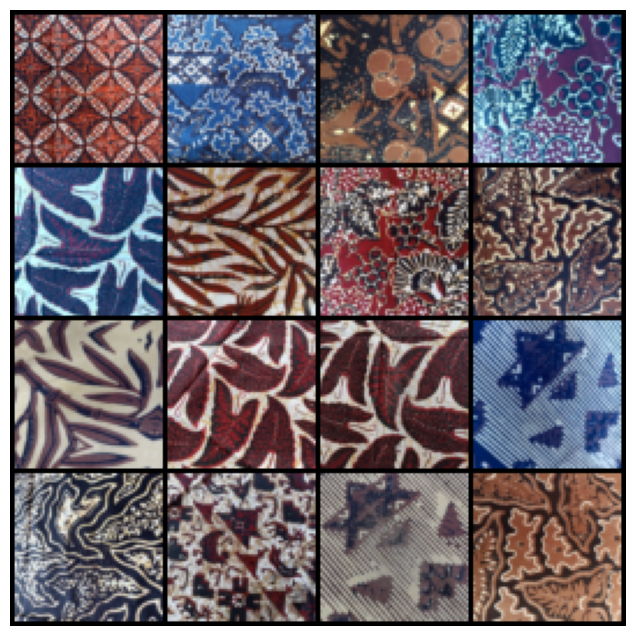

In [2]:
import os
import torch
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Path absolut dataset
data_dir = r"C:\Dastin\All About ITTP\Semester 6\5. Proyek Sains data (Capstone)\Batik"

# Transformasi gambar
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset = datasets.ImageFolder(data_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

images, labels = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(torchvision.utils.make_grid(images[:16], nrow=4, normalize=True).permute(1, 2, 0))
plt.show()

In [3]:
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 256 * 8 * 8),
            nn.BatchNorm1d(256 * 8 * 8),
            nn.ReLU(),
            nn.Unflatten(1, (256, 8, 8)),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.Linear(256 * 8 * 8, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.model(img)

# Inisialisasi model
latent_dim = 100
generator = Generator(latent_dim)
discriminator = Discriminator()


Epoch 0/100 - D Loss: 0.070973239839077 - G Loss: 4.692381858825684


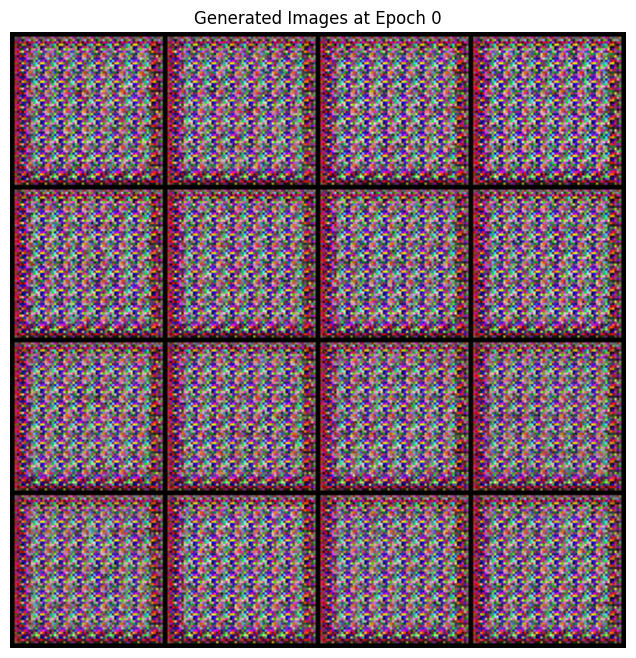

Images saved at output_images/epoch_0.png
Epoch 10/100 - D Loss: 0.06195589900016785 - G Loss: 4.486566066741943


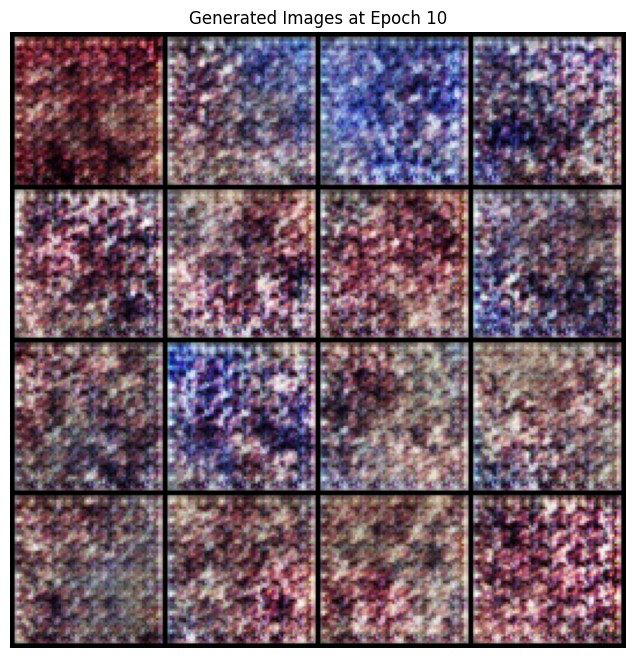

Images saved at output_images/epoch_10.png
Epoch 20/100 - D Loss: 0.11787313967943192 - G Loss: 5.338790416717529


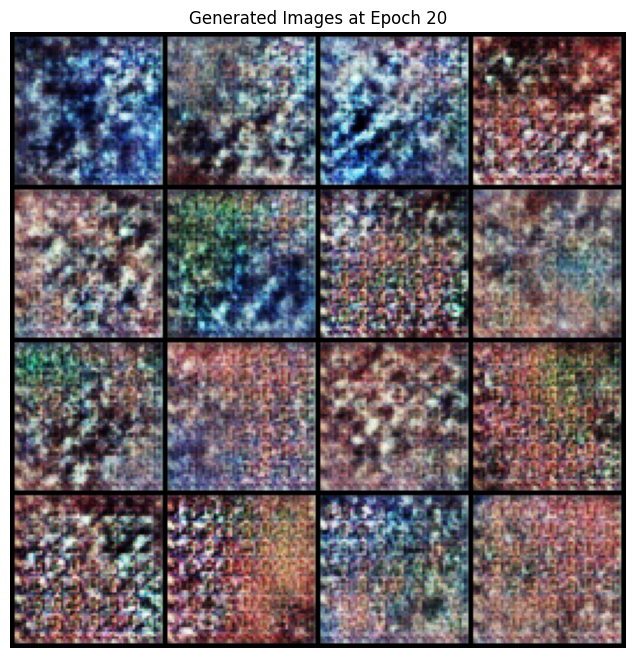

Images saved at output_images/epoch_20.png
Epoch 30/100 - D Loss: 0.4951725900173187 - G Loss: 0.6068668365478516


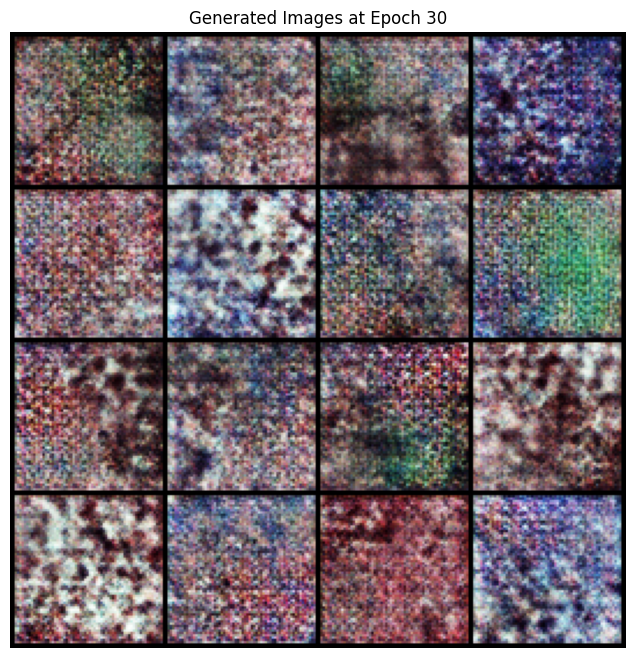

Images saved at output_images/epoch_30.png
Epoch 40/100 - D Loss: 0.6491253972053528 - G Loss: 6.810051918029785


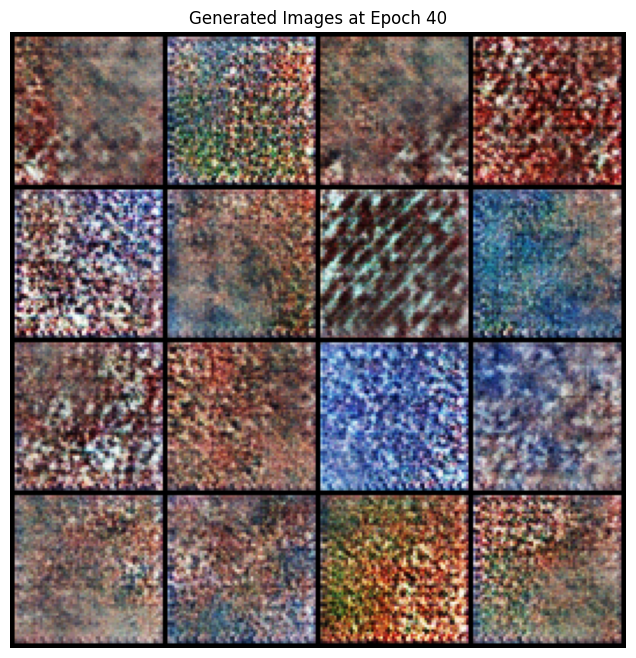

Images saved at output_images/epoch_40.png
Epoch 50/100 - D Loss: 0.05069248378276825 - G Loss: 4.5540313720703125


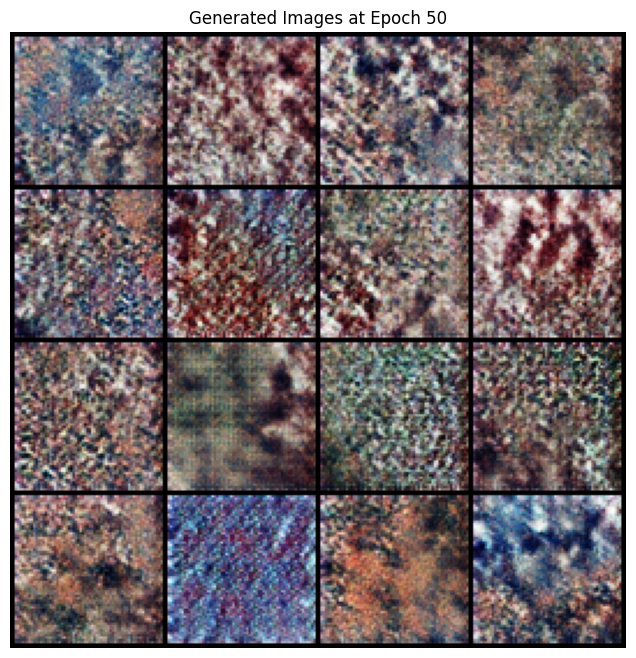

Images saved at output_images/epoch_50.png
Epoch 60/100 - D Loss: 0.011644817888736725 - G Loss: 5.314225196838379


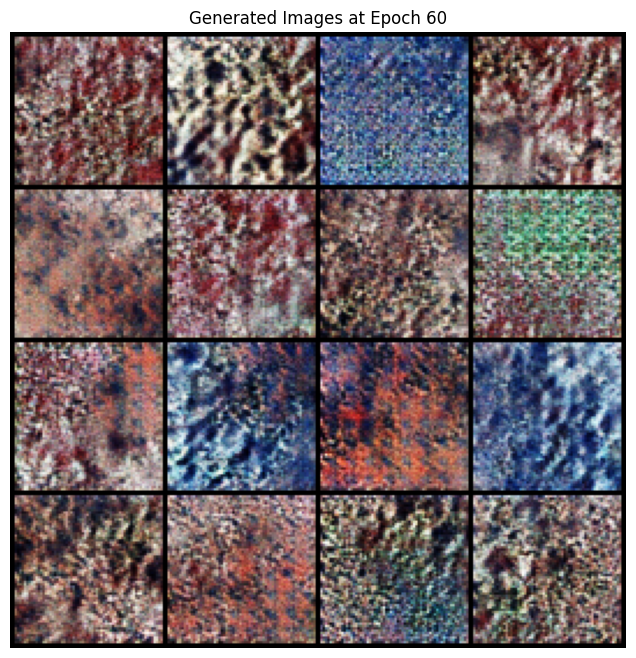

Images saved at output_images/epoch_60.png
Epoch 70/100 - D Loss: 0.06216439604759216 - G Loss: 4.480873107910156


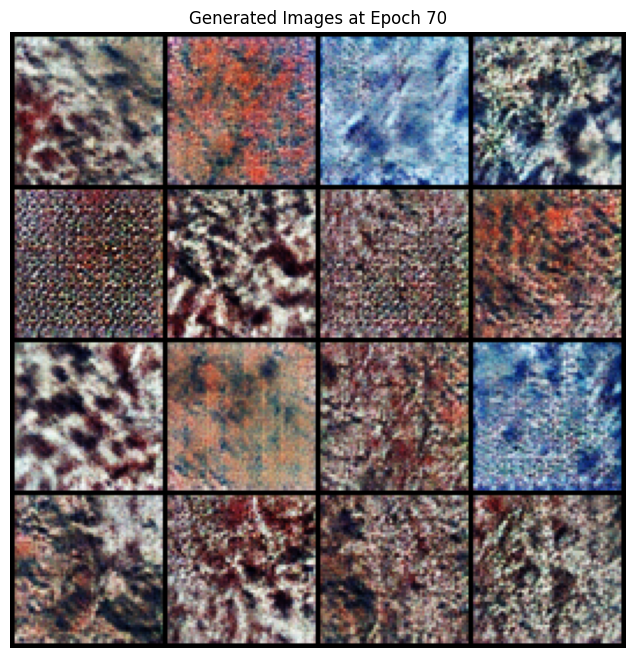

Images saved at output_images/epoch_70.png
Epoch 80/100 - D Loss: 0.08911919593811035 - G Loss: 5.238706111907959


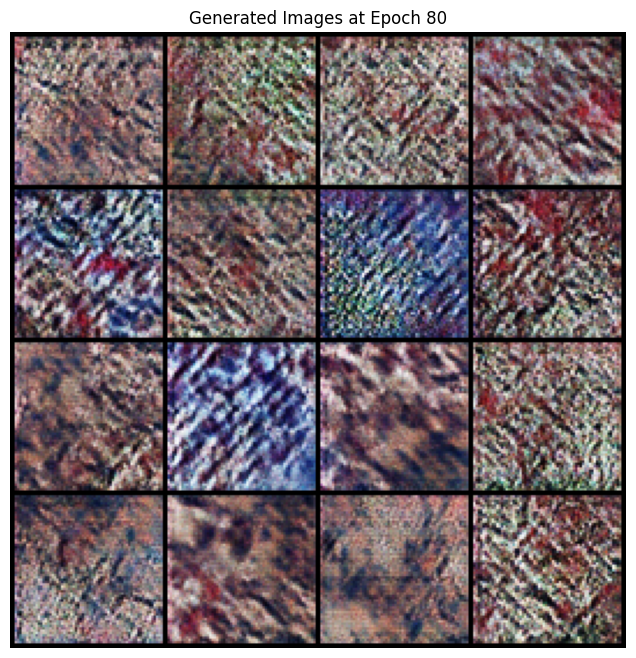

Images saved at output_images/epoch_80.png
Epoch 90/100 - D Loss: 0.02739979699254036 - G Loss: 6.265892028808594


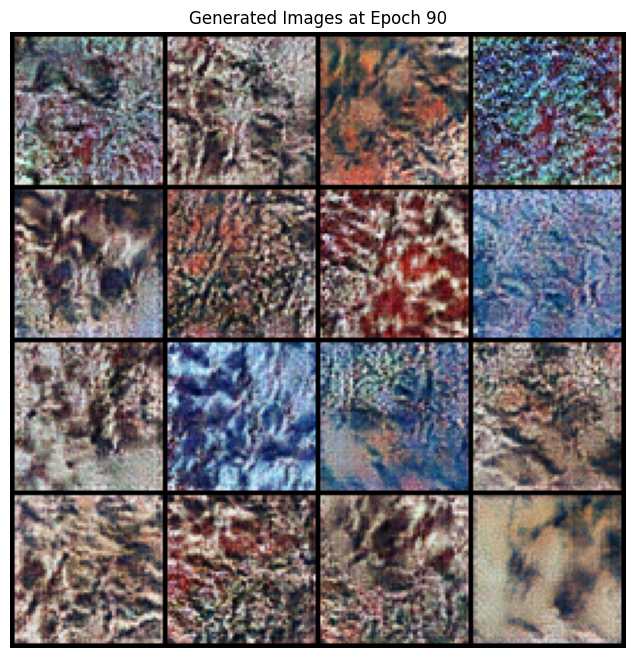

Images saved at output_images/epoch_90.png


In [ ]:
import torch.optim as optim

# Optimizer
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
criterion = nn.BCELoss()

os.makedirs('output_images', exist_ok=True)

# Fungsi untuk visualisasi hasil generator
def save_generated_images(epoch, generator, latent_dim, num_images=16):
    noise = torch.randn(num_images, latent_dim)
    generated_images = generator(noise).detach()

    # Plotting
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title(f"Generated Images at Epoch {epoch}")
    grid = torchvision.utils.make_grid(generated_images, nrow=4, normalize=True)
    plt.imshow(grid.permute(1, 2, 0))
    plt.show()
    
    # Save image
    output_path = f"output_gambar(latentdim256)/epoch_{epoch}.png"
    torchvision.utils.save_image(generated_images, output_path, nrow=4, normalize=True)
    print(f"Images saved at {output_path}")

# Training Loop
epochs = 100
for epoch in range(epochs):
    for real_images, _ in dataloader:
        batch_size = real_images.size(0)

        real_labels = torch.ones(batch_size, 1)
        fake_labels = torch.zeros(batch_size, 1)

        # Train Discriminator
        noise = torch.randn(batch_size, latent_dim)
        fake_images = generator(noise)
        d_loss_real = criterion(discriminator(real_images), real_labels)
        d_loss_fake = criterion(discriminator(fake_images.detach()), fake_labels)
        d_loss = (d_loss_real + d_loss_fake) / 2

        optimizer_D.zero_grad()
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        g_loss = criterion(discriminator(fake_images), real_labels)

        optimizer_G.zero_grad()
        g_loss.backward()
        optimizer_G.step()

    if epoch % 10 == 0:
        print(f"Epoch {epoch}/{epochs} - D Loss: {d_loss.item()} - G Loss: {g_loss.item()}")
        save_generated_images(epoch, generator, latent_dim)

In [5]:
torch.save(generator.state_dict(), 'generator_final.pth')
torch.save(discriminator.state_dict(), 'discriminator_final.pth')

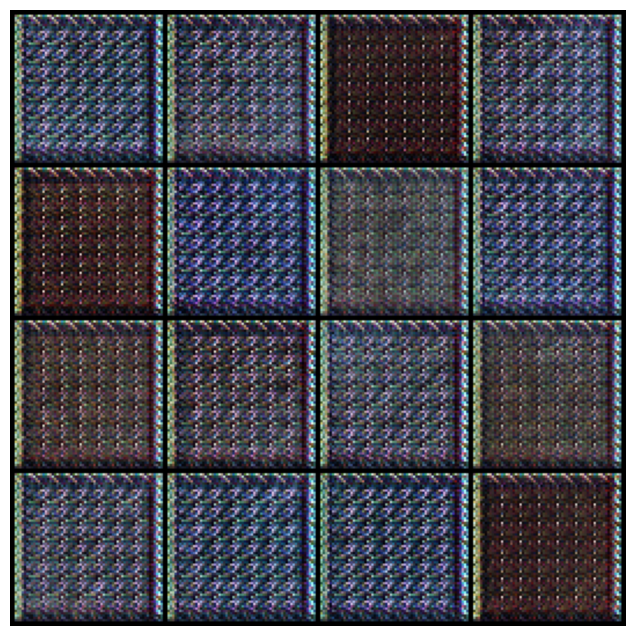

In [6]:
generator.load_state_dict(torch.load('generator_final.pth'))
generator.eval()

noise = torch.randn(16, latent_dim)
generated_images = generator(noise).detach()

# Tampilkan hasil
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(torchvision.utils.make_grid(generated_images, nrow=4, normalize=True).permute(1, 2, 0))
plt.show()